In [12]:
from pycocotools.coco import COCO
import numpy as np
import skimage.io as io
import matplotlib.pyplot as plt
import pylab
from itertools import chain

import random
import string

import cv2
import os
from PIL import Image
from pickle import dump, load
import json

import nltk
nltk.download("stopwords")
from nltk.corpus import stopwords

import tensorflow as tf
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.layers import Embedding, LSTM, Dense, Bidirectional, Input, Dropout, Attention
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications.xception import Xception, preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.utils import to_categorical

from keras.layers import add

from tensorflow.keras.models import Model, load_model

from tqdm.notebook import tqdm

pylab.rcParams['figure.figsize'] = (8.0, 10.0)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Admin\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [3]:
coco_caps = COCO("annotations/captions_train2017.json")
coco=COCO("annotations/instances_train2017.json")

loading annotations into memory...
Done (t=1.33s)
creating index...
index created!
loading annotations into memory...
Done (t=28.34s)
creating index...
index created!


In [4]:
filterClasses = ['person', 'skateboard']
filterClasses2 = ['person', 'baseball bat']
filterClasses3 = ['person', 'tennis racket']

catIds = coco.getCatIds(catNms=filterClasses)
catIds2 = coco.getCatIds(catNms=filterClasses2)
catIds3 = coco.getCatIds(catNms=filterClasses3)
imgIdss = coco.getImgIds(catIds=catIds) + coco.getImgIds(catIds=catIds2) +coco.getImgIds(catIds=catIds3)
print("Number of images containing all the  classes:", len(imgIdss))

Number of images containing all the  classes: 9255


In [5]:
dataset = dict()
imgcaptions = []

for imgid in imgIdss:
    img = coco.loadImgs(imgid)[0]
    annIds = coco_caps.getAnnIds(imgIds=img['id']);
    anns = coco_caps.loadAnns(annIds)
    imgcaptions = []
    for cap in anns:
        cap = cap['caption'].translate(str.maketrans('', '', string.punctuation))
        cap = cap.replace("-"," ")
        cap = cap.split()
        cap = [word.lower() for word in cap]
        
        cap = '<start> ' + " ".join(cap) + ' <end>'
        imgcaptions.append(cap)
        
    dataset[img['coco_url']] = imgcaptions 

print('Cap', imgcaptions)
print("Length of Dataset: ",len(dataset))

Cap ['<start> a young man holding a tennis racquet on top of a tennis court <end>', '<start> a man makes a backhand shot in a tennis match on a clay court <end>', '<start> a young man playing tennis on a tennis court <end>', '<start> a man plays tennis on a tennis court <end>', '<start> a man is playing tennis on a court <end>']
Length of Dataset:  9251


In [6]:
flatten_list = list(chain.from_iterable(dataset.values()))

tokenizer = Tokenizer(oov_token='<oov>')
tokenizer.fit_on_texts(flatten_list)
total_words = len(tokenizer.word_index) + 1

print("Vocabulary length: ", total_words)

Vocabulary length:  5378


In [7]:
import pickle

with open("image_features.pickle", "rb") as f:
    image_features = pickle.load(f)

In [8]:
def dict_to_list(descriptions):
    all_desc = []
    for key in descriptions.keys():
        [all_desc.append(d) for d in descriptions[key]]
    return all_desc

def max_length(descriptions):
    desc_list = dict_to_list(descriptions)
    return max(len(d.split()) for d in desc_list)
    
max_length = max_length(dataset)
max_length

51

In [9]:
def extract_features(filename, model):
        try:
            image = Image.open(filename)

        except:
            print("ERROR: Couldn't open image! Make sure the image path and extension is correct")
        image = image.resize((299,299))
        image = np.array(image)
        
        if image.shape[1] == 4: 
            image = image[..., :3]
        image = np.expand_dims(image, axis=0)
        image = image/127.5
        image = image - 1.0
        feature = model.predict(image)
        return feature

def word_for_id(integer, tokenizer):
    for word, index in tokenizer.word_index.items():
        if index == integer:
            return word
    return None


def generate_desc(model, tokenizer, photo, max_length):
    in_text = 'start'
    for i in range(max_length):
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        sequence = pad_sequences([sequence], maxlen=max_length)
        pred = model.predict([photo,sequence], verbose=0)
        pred = np.argmax(pred)
        word = word_for_id(pred, tokenizer)
        
        if word is None:
            break
        in_text += ' ' + word
        
        if word == 'end':
            break
    words = in_text.split()
    words_trimmed = words[1:-1]
    caption_trimmed = " ".join(words_trimmed)    
    return caption_trimmed

model = load_model('model_0.h5')
xception_model = Xception(include_top=False, pooling="avg")

In [18]:
def generate_caps(path):
    photo = extract_features(path, xception_model)
    img = Image.open(path)
    cap = generate_desc(model, tokenizer, photo, max_length)
    
    # print(cap)
    # plt.imshow(img)
    # plt.show()
    
    return cap

In [19]:
folder_path = "vali/"
img_ides = [f.split('.')[0] for f in os.listdir(folder_path)]
print(img_ides)

['000000000885', '000000001000', '000000002153', '000000003553', '000000007977', '000000012120', '000000012639', '000000013201', '000000013546', '000000015597', '000000018491', '000000019432', '000000025096', '000000026690', '000000031093', '000000031217', '000000032081', '000000033005', '000000033759', '000000035197', '000000035279', '000000039405', '000000039551', '000000043816', '000000044877', '000000046252', '000000054593', '000000055950', '000000060507', '000000062355', '000000062692', '000000064523', '000000064718', '000000065350', '000000065798', '000000067310', '000000071877', '000000072281', '000000072795', '000000074092', '000000076468', '000000078915', '000000079969', '000000084031', '000000084492', '000000085772', '000000087038', '000000087476', '000000088970', '000000089296', '000000090284', '000000093717', '000000096427', '000000098287', '000000098853', '000000101068', '000000104424', '000000106912', '000000111207', '000000117744', '000000119445', '000000119911', '000000

In [20]:
capti = {}
for img_id in img_ides:
    img_path=folder_path+img_id+'.jpg'
    photo = extract_features(img_path, xception_model)
    desc = generate_caps(img_path)
    capti[str(int(img_id))] = desc
with open('generated_captions.json', 'w') as f:
    json.dump(capti, f)

1/1 [==============================] - 0s 224ms/step


In [21]:
coco_val = COCO('./annotations/captions_val2017.json')
gts = {}
for img_id in img_ides:
    img_id=int(img_id)
    # print(img_id)
    ann_ids = coco_val.getAnnIds(imgIds=img_id)
    captions = [coco_val.anns[ann_id]['caption'] for ann_id in ann_ids]
    # print(captions)
    gts[str(int(img_id))] = captions
with open('gts.json', 'w') as f:
    json.dump(gts, f)

loading annotations into memory...
Done (t=0.10s)
creating index...
index created!


In [22]:
import json

new_cap = []
for k, v in capti.items():
    new_cap.append({'image_id': k, 'caption': v})

new_ref = {'images': [], 'annotations': []}
for k, refs in gts.items():
    new_ref['images'].append({'id': k})
    for ref in refs:
        new_ref['annotations'].append({'image_id': k, 'id': k, 'caption': ref})

with open('references.json', 'w') as fgts:
    json.dump(new_ref, fgts)
with open('captions.json', 'w') as fres:
    json.dump(new_cap, fres)

In [23]:
from pycocotools.coco import COCO
from pycocoevalcap.eval import COCOEvalCap

annotation_file = 'references.json'
results_file = 'captions.json'

In [24]:
coco = COCO(annotation_file)
coco_result = coco.loadRes(results_file)

coco_eval = COCOEvalCap(coco, coco_result)

loading annotations into memory...
Done (t=0.02s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!


In [25]:
coco_eval.params['image_id'] = coco_result.getImgIds()
coco_eval.evaluate()

for metric, score in coco_eval.eval.items():
    print(f'{metric}: {score:.3f}')

tokenization...
setting up scorers...
computing Bleu score...
{'testlen': 2765, 'reflen': 2785, 'guess': [2765, 2465, 2165, 1865], 'correct': [2018, 1040, 449, 200]}
ratio: 0.9928186714538626
Bleu_1: 0.725
Bleu_2: 0.551
Bleu_3: 0.397
Bleu_4: 0.286
computing METEOR score...
METEOR: 0.269
computing Rouge score...
ROUGE_L: 0.554
computing CIDEr score...
CIDEr: 0.590
Bleu_1: 0.725
Bleu_2: 0.551
Bleu_3: 0.397
Bleu_4: 0.286
METEOR: 0.269
ROUGE_L: 0.554
CIDEr: 0.590


1/1 [==============================] - 0s 176ms/step
a baseball player swinging a bat on a field


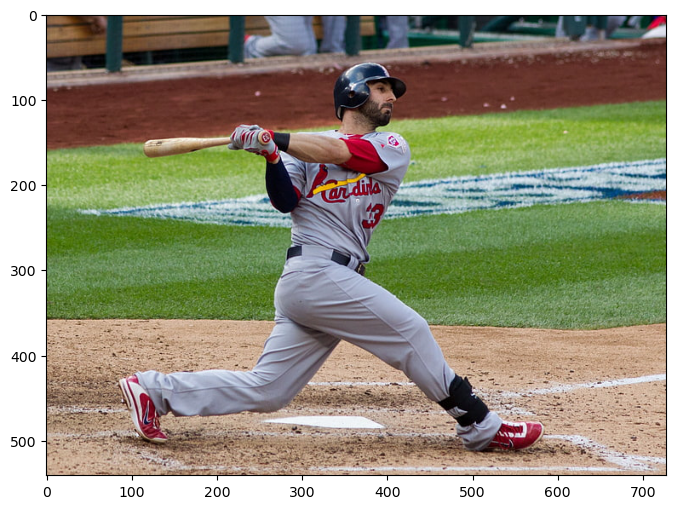

None
1/1 [==============================] - 0s 264ms/step
a baseball player swinging a bat on a field


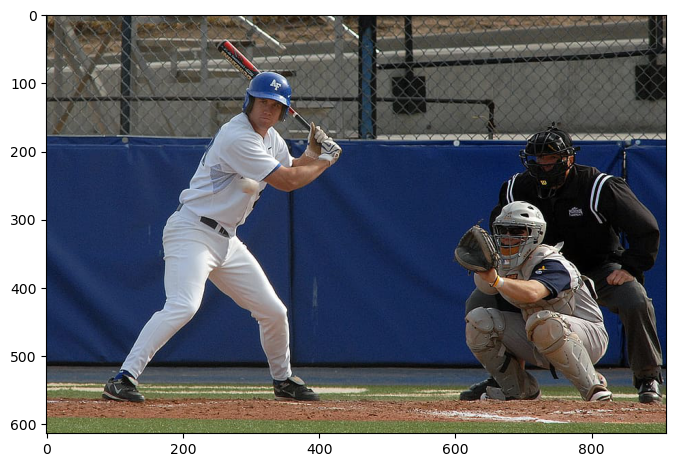

None
1/1 [==============================] - 0s 283ms/step
a man holding a tennis racquet on a tennis court


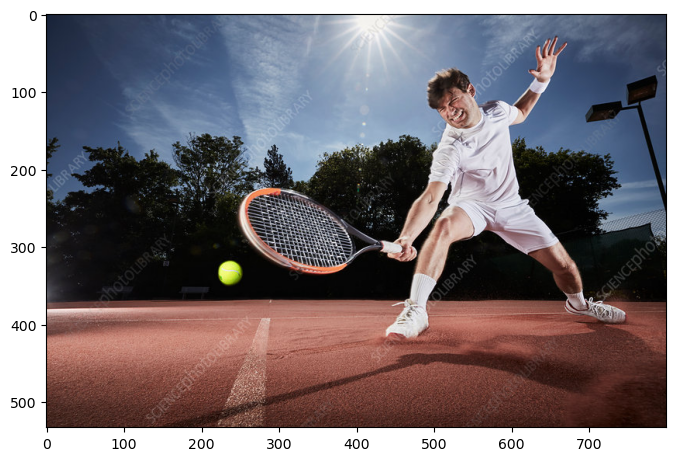

None
1/1 [==============================] - 0s 219ms/step
a man is playing tennis on a court


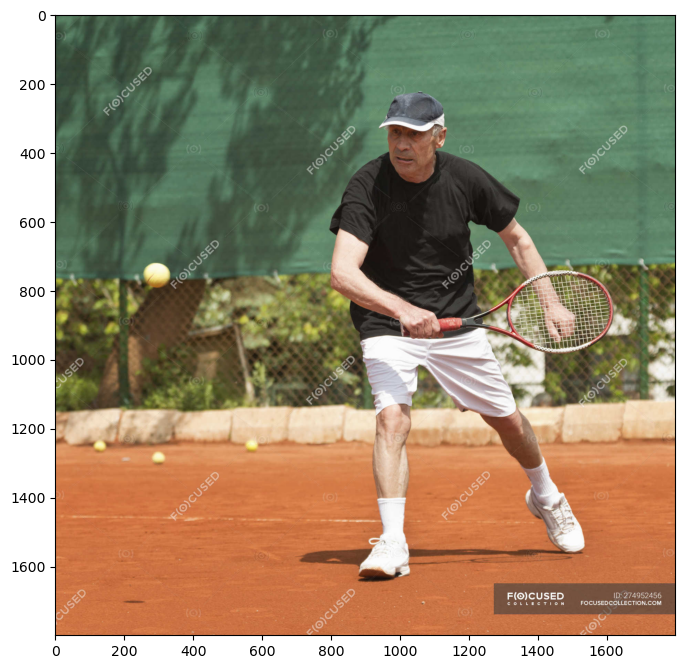

None
1/1 [==============================] - 0s 208ms/step
a man riding a skateboard up the side of a ramp


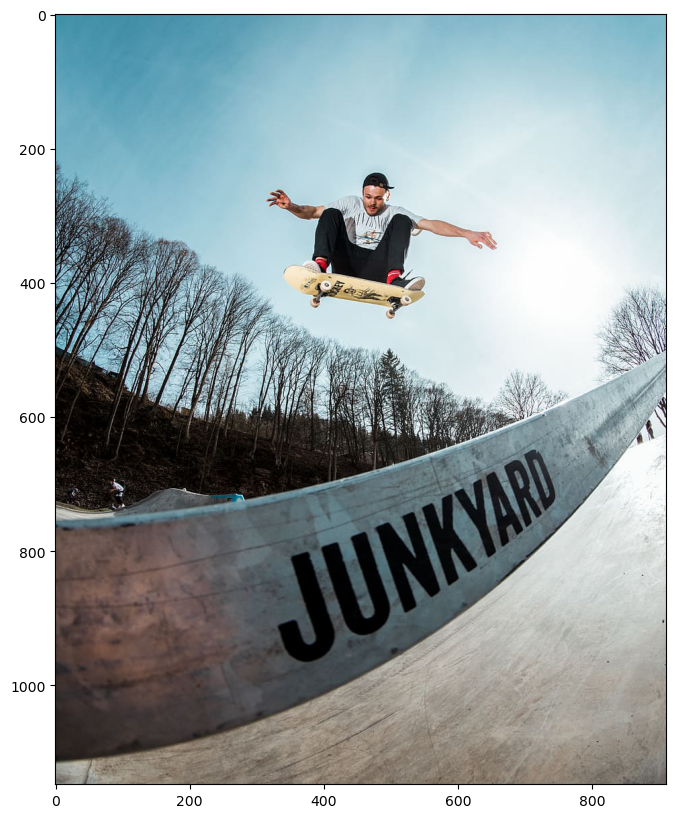

None
1/1 [==============================] - 0s 389ms/step
a man holding a tennis racquet on a tennis court


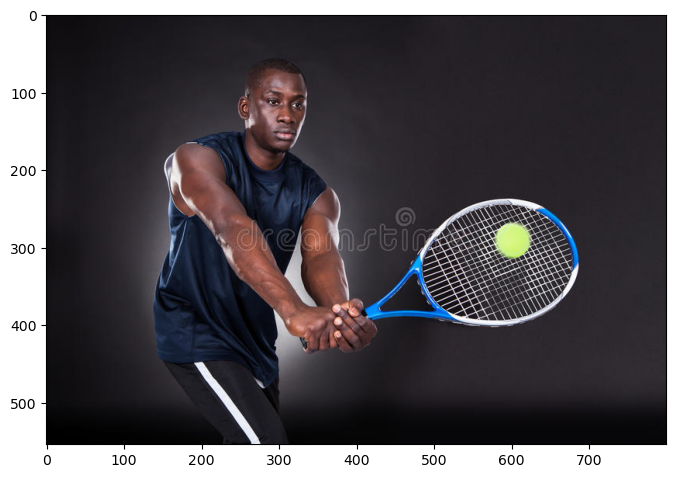

None


In [15]:
folder_path = "./testing/google"
img_paths = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith('.jpg')]
for img_path in img_paths:
    print(generate_caps(img_path))

1/1 [==============================] - 0s 160ms/step
a man holding a tennis racquet on a tennis court


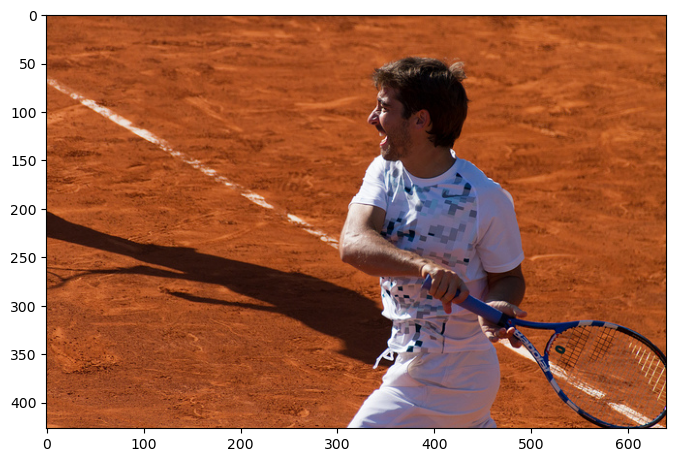

None
1/1 [==============================] - 0s 285ms/step
a baseball player swinging a bat on a field


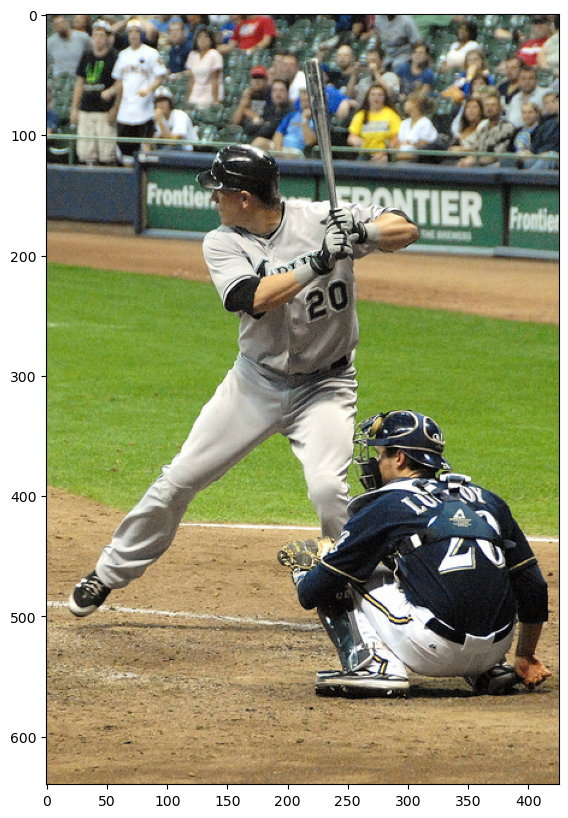

None
1/1 [==============================] - 0s 330ms/step
a man riding a skateboard down a ramp


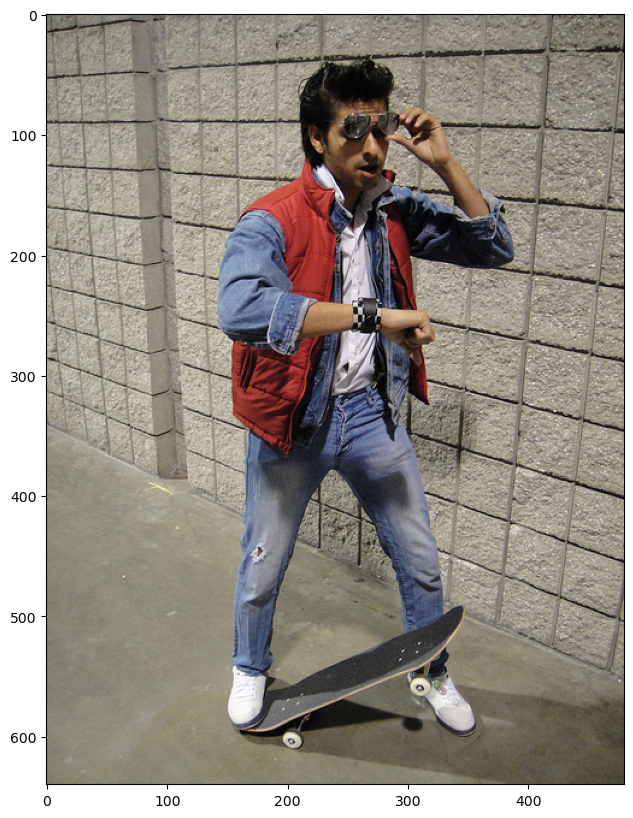

None
1/1 [==============================] - 0s 318ms/step
a man holding a tennis racquet on a tennis court


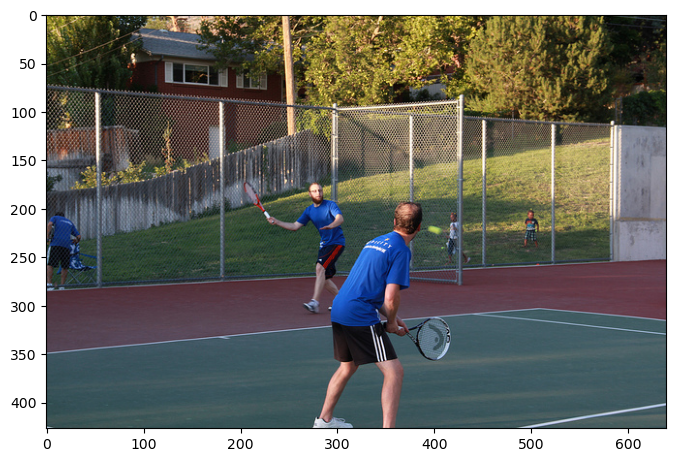

None
1/1 [==============================] - 0s 330ms/step
a man riding a skateboard down a stance rail


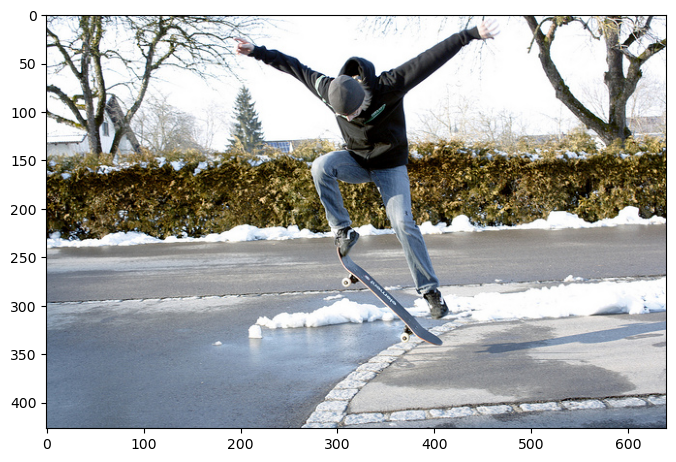

None
1/1 [==============================] - 0s 330ms/step
a baseball player swinging a bat on a field


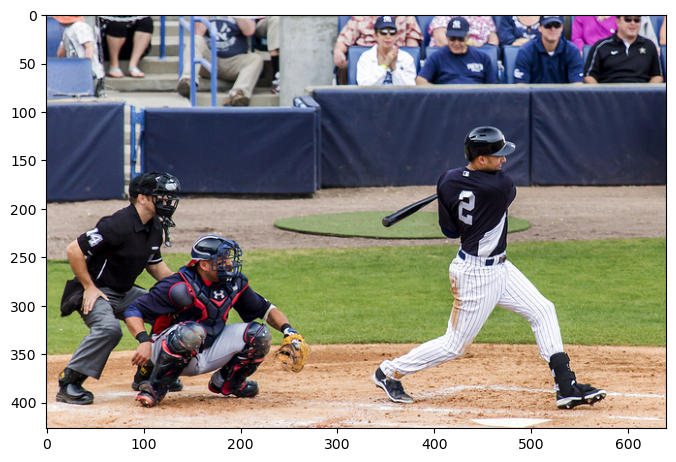

None
1/1 [==============================] - 0s 272ms/step
a man is playing tennis on a court


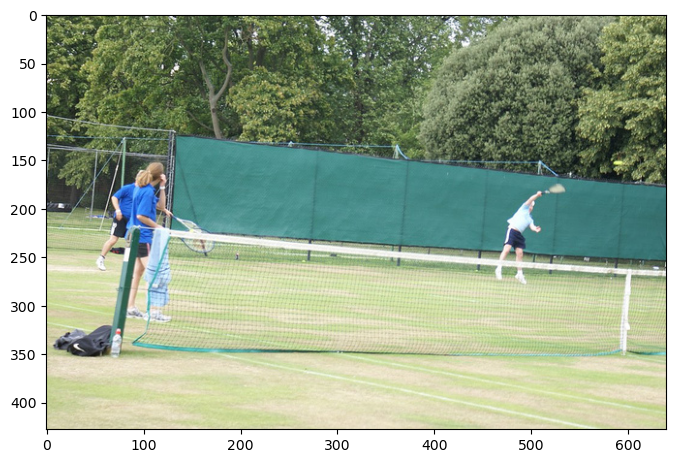

None
1/1 [==============================] - 0s 243ms/step
a man riding a skateboard down a stance rail


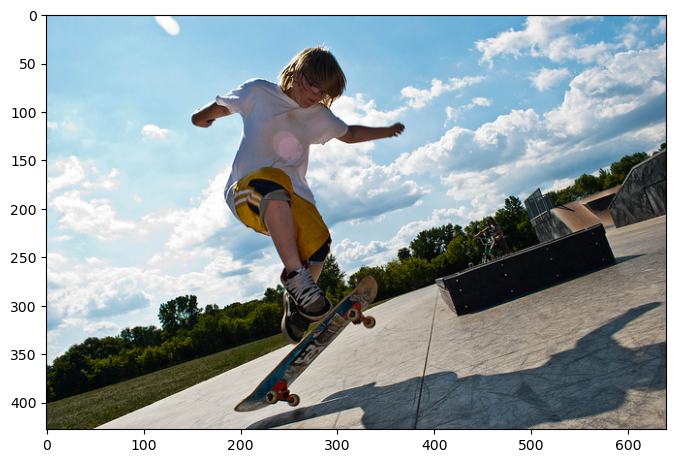

None
1/1 [==============================] - 0s 248ms/step
a woman is playing tennis on a court


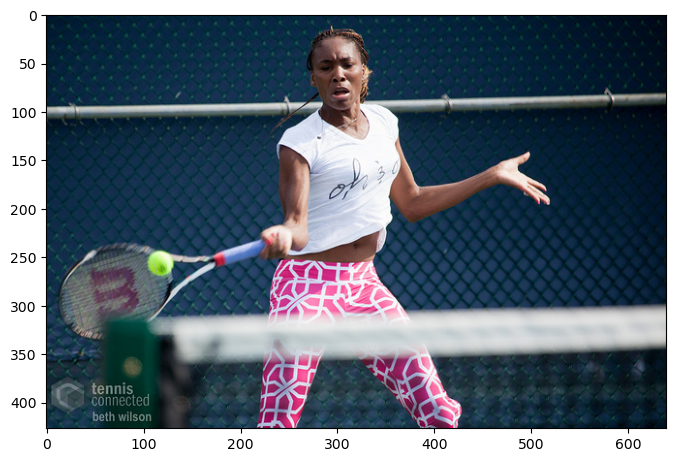

None
1/1 [==============================] - 0s 248ms/step
a man riding a skateboard down a street


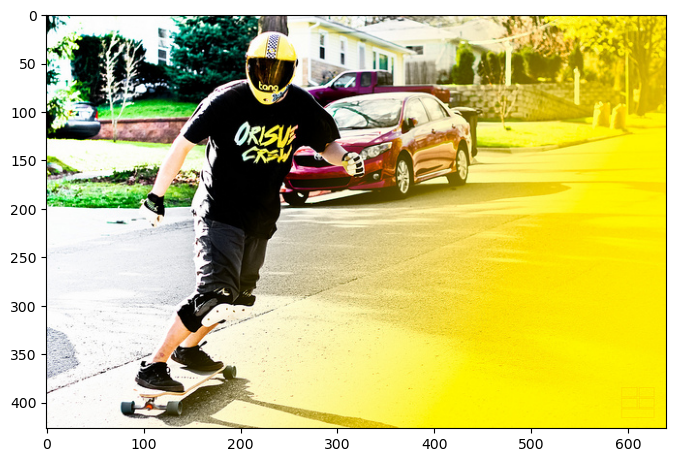

None


In [14]:
folder_path = "./testing"
img_paths = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith('.jpg')]
for img_path in img_paths:
    print(generate_caps(img_path))